# Telecom Churn using XGBoost classifier with PCA for dimensionality reduction

#### In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

###### For many incumbent operators, retaining high profitable customers is the number one business goal. To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.
###### Lets analyze customer-level data of a leading telecom firm, and build predictive models to identify customers at high risk of churn.

In [76]:
#Importing all the 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score,precision_score,recall_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score, learning_curve
import xgboost as xgb

In [3]:
# Importing train, test and 
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")
summary = pd.read_csv("sample.csv")

In [4]:
train.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,...,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,...,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,...,0,0,NaN,1.0,NaN,710,0.0,0.0,0.0,0
2,2,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,60.806,103.176,...,0,0,NaN,NaN,NaN,882,0.0,0.0,0.0,0
3,3,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,156.362,205.260,...,0,0,NaN,NaN,NaN,982,0.0,0.0,0.0,0
4,4,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,240.708,128.191,...,1,0,1.0,1.0,1.0,647,0.0,0.0,0.0,0


In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Columns: 172 entries, id to churn_probability
dtypes: float64(135), int64(28), object(9)
memory usage: 91.9+ MB


In [6]:
train['churn_probability'].value_counts()

0    62867
1     7132
Name: churn_probability, dtype: int64

In [7]:
summary.head()

,id,churn_probability
0,69999,0
1,70000,0
2,70001,0
3,70002,0
4,70003,0


(array([62867.,  7132.]),
 array([0. , 0.5, 1. ]),
 <BarContainer object of 2 artists>)

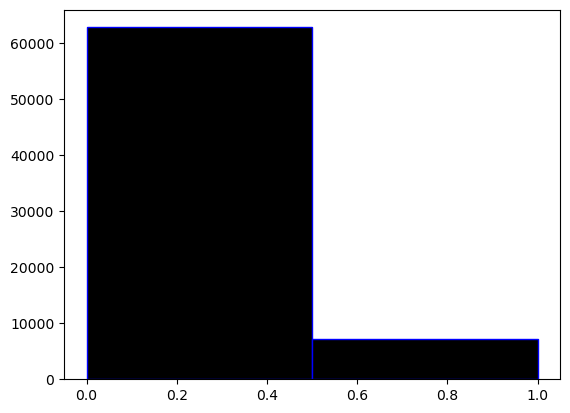

In [8]:
plt.hist(train.churn_probability, bins = 2, edgecolor='blue', color='black')

### Data Cleaning

In [9]:
train['circle_id'].value_counts()

109    69999
Name: circle_id, dtype: int64

In [10]:
#Dropping circle_id as it contains only one value
train = train.drop(['circle_id'], axis=1)
test = test.drop(['circle_id'], axis=1)

In [11]:
train.head()

,id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,...,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,7.527,...,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,42.953,...,0,0,NaN,1.0,NaN,710,0.0,0.0,0.0,0
2,2,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,60.806,103.176,0.000,...,0,0,NaN,NaN,NaN,882,0.0,0.0,0.0,0
3,3,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,156.362,205.260,111.095,...,0,0,NaN,NaN,NaN,982,0.0,0.0,0.0,0
4,4,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,240.708,128.191,101.565,...,1,0,1.0,1.0,1.0,647,0.0,0.0,0.0,0


In [12]:
#Removing all the columns which have just one value in all the rows
for col in train.columns:
    if train[col].nunique() == 1:
        train.drop(col,inplace=True,axis=1)

In [13]:
for col in test.columns:
    if test[col].nunique() == 1:
        test.drop(col,inplace=True,axis=1)

In [14]:
train.head()

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,...,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,...,0,0,NaN,1.0,NaN,710,0.0,0.0,0.0,0
2,2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,...,0,0,NaN,NaN,NaN,882,0.0,0.0,0.0,0
3,3,156.362,205.260,111.095,7.26,16.01,0.00,68.76,78.48,50.23,...,0,0,NaN,NaN,NaN,982,0.0,0.0,0.0,0
4,4,240.708,128.191,101.565,21.28,4.83,6.13,56.99,38.11,9.63,...,1,0,1.0,1.0,1.0,647,0.0,0.0,0.0,0


In [15]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Columns: 159 entries, id to churn_probability
dtypes: float64(126), int64(27), object(6)
memory usage: 84.9+ MB


In [16]:
#Getting rid of id field as it is not needed for prediction
train = train.drop(['id'], 1)
test = test.drop(['id'], 1)

/var/folders/gg/7k4yc41x7613l28wqf24kd0m0000gn/T/ipykernel_76376/657536584.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  train = train.drop(['id'], 1)
/var/folders/gg/7k4yc41x7613l28wqf24kd0m0000gn/T/ipykernel_76376/657536584.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  test = test.drop(['id'], 1)


In [17]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Columns: 158 entries, arpu_6 to churn_probability
dtypes: float64(126), int64(26), object(6)
memory usage: 84.4+ MB


In [18]:
train = train.dropna(axis=1, how='all')

In [19]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Columns: 158 entries, arpu_6 to churn_probability
dtypes: float64(126), int64(26), object(6)
memory usage: 84.4+ MB


### Checking missing values and imputing them

In [20]:
train.isnull().sum()

arpu_6                  0
arpu_7                  0
arpu_8                  0
onnet_mou_6          2768
onnet_mou_7          2687
                     ... 
aon                     0
aug_vbc_3g              0
jul_vbc_3g              0
jun_vbc_3g              0
churn_probability       0
Length: 158, dtype: int64

In [21]:
list = train.columns[train.isnull().any()]

In [22]:
# List of columns with missing values
list

Index(['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6',
       'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7',
       'roam_ic_mou_8', 'roam_og_mou_6',
       ...
       'arpu_3g_8', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8', 'night_pck_user_6',
       'night_pck_user_7', 'night_pck_user_8', 'fb_user_6', 'fb_user_7',
       'fb_user_8'],
      dtype='object', length=114)

In [23]:
for col in list:
    print(col)

onnet_mou_6
onnet_mou_7
onnet_mou_8
offnet_mou_6
offnet_mou_7
offnet_mou_8
roam_ic_mou_6
roam_ic_mou_7
roam_ic_mou_8
roam_og_mou_6
roam_og_mou_7
roam_og_mou_8
loc_og_t2t_mou_6
loc_og_t2t_mou_7
loc_og_t2t_mou_8
loc_og_t2m_mou_6
loc_og_t2m_mou_7
loc_og_t2m_mou_8
loc_og_t2f_mou_6
loc_og_t2f_mou_7
loc_og_t2f_mou_8
loc_og_t2c_mou_6
loc_og_t2c_mou_7
loc_og_t2c_mou_8
loc_og_mou_6
loc_og_mou_7
loc_og_mou_8
std_og_t2t_mou_6
std_og_t2t_mou_7
std_og_t2t_mou_8
std_og_t2m_mou_6
std_og_t2m_mou_7
std_og_t2m_mou_8
std_og_t2f_mou_6
std_og_t2f_mou_7
std_og_t2f_mou_8
std_og_mou_6
std_og_mou_7
std_og_mou_8
isd_og_mou_6
isd_og_mou_7
isd_og_mou_8
spl_og_mou_6
spl_og_mou_7
spl_og_mou_8
og_others_6
og_others_7
og_others_8
loc_ic_t2t_mou_6
loc_ic_t2t_mou_7
loc_ic_t2t_mou_8
loc_ic_t2m_mou_6
loc_ic_t2m_mou_7
loc_ic_t2m_mou_8
loc_ic_t2f_mou_6
loc_ic_t2f_mou_7
loc_ic_t2f_mou_8
loc_ic_mou_6
loc_ic_mou_7
loc_ic_mou_8
std_ic_t2t_mou_6
std_ic_t2t_mou_7
std_ic_t2t_mou_8
std_ic_t2m_mou_6
std_ic_t2m_mou_7
std_ic_t2m_mou_

In [24]:
train['onnet_mou_6'].value_counts

<bound method IndexOpsMixin.value_counts of 0         48.58
1          0.00
2          0.53
3          7.26
4         21.28
          ...  
69994      0.00
69995    116.54
69996     77.13
69997     14.01
69998      0.00
Name: onnet_mou_6, Length: 69999, dtype: float64>

In [25]:
#Filling missing values with 0 as the value 0 is noticed in other rows as well where there are no calls within the same operator network 
train[['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8']] = train[['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8']].fillna(0)
test[['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8']] = test[['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8']].fillna(0)

In [26]:
#Filling missing values with 0 as the value 0 is noticed in other rows as well where there are no calls outside the operator T network
train[['offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8']] = train[['offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8']].fillna(0)
test[['offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8']] = test[['offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8']].fillna(0)

In [27]:
#Filling missing values in some more columns.

train[['roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8']] = train[['roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8']].fillna(0)
test[['roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8']] = test[['roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8']].fillna(0)

In [28]:
train[['roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8']] = train[['roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8']].fillna(0)
test[['roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8']] = test[['roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8']].fillna(0)

In [29]:
train[['loc_og_t2t_mou_6','loc_og_t2t_mou_7','loc_og_t2t_mou_8','loc_og_t2m_mou_6','loc_og_t2m_mou_7','loc_og_t2m_mou_8','loc_og_t2f_mou_6','loc_og_t2f_mou_7','loc_og_t2f_mou_8','loc_og_t2c_mou_6','loc_og_t2c_mou_7','loc_og_t2c_mou_8']] = train[['loc_og_t2t_mou_6','loc_og_t2t_mou_7','loc_og_t2t_mou_8','loc_og_t2m_mou_6','loc_og_t2m_mou_7','loc_og_t2m_mou_8','loc_og_t2f_mou_6','loc_og_t2f_mou_7','loc_og_t2f_mou_8','loc_og_t2c_mou_6','loc_og_t2c_mou_7','loc_og_t2c_mou_8']].fillna(0)
test[['loc_og_t2t_mou_6','loc_og_t2t_mou_7','loc_og_t2t_mou_8','loc_og_t2m_mou_6','loc_og_t2m_mou_7','loc_og_t2m_mou_8','loc_og_t2f_mou_6','loc_og_t2f_mou_7','loc_og_t2f_mou_8','loc_og_t2c_mou_6','loc_og_t2c_mou_7','loc_og_t2c_mou_8']] = test[['loc_og_t2t_mou_6','loc_og_t2t_mou_7','loc_og_t2t_mou_8','loc_og_t2m_mou_6','loc_og_t2m_mou_7','loc_og_t2m_mou_8','loc_og_t2f_mou_6','loc_og_t2f_mou_7','loc_og_t2f_mou_8','loc_og_t2c_mou_6','loc_og_t2c_mou_7','loc_og_t2c_mou_8']].fillna(0)

In [30]:
#Creating a df of those columns which have null values just to get the numbers and types.
obj = train[train.columns[train.isnull().any()]]

In [31]:
obj.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 90 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   loc_og_mou_6              67231 non-null  float64
 1   loc_og_mou_7              67312 non-null  float64
 2   loc_og_mou_8              66296 non-null  float64
 3   std_og_t2t_mou_6          67231 non-null  float64
 4   std_og_t2t_mou_7          67312 non-null  float64
 5   std_og_t2t_mou_8          66296 non-null  float64
 6   std_og_t2m_mou_6          67231 non-null  float64
 7   std_og_t2m_mou_7          67312 non-null  float64
 8   std_og_t2m_mou_8          66296 non-null  float64
 9   std_og_t2f_mou_6          67231 non-null  float64
 10  std_og_t2f_mou_7          67312 non-null  float64
 11  std_og_t2f_mou_8          66296 non-null  float64
 12  std_og_mou_6              67231 non-null  float64
 13  std_og_mou_7              67312 non-null  float64
 14  std_og

In [32]:
for col in train:
    if train[col].dtype == 'float':
        train[col] = train[col].fillna(0)

for col in test:
    if test[col].dtype == 'float':
        test[col] = test[col].fillna(0)        

In [33]:
train.columns[train.isnull().any()]

Index(['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8',
       'date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8'],
      dtype='object')

In [34]:
train['date_of_last_rech_data_6'].isnull().sum()

52431

In [35]:
#Dropping date_of_last_rech_data_6 column as there are too many null values
train = train.drop(['date_of_last_rech_data_6'], axis = 1)
test = test.drop(['date_of_last_rech_data_6'], axis = 1)

In [36]:
train['date_of_last_rech_data_8'].isnull().sum()

51582

In [37]:
#Dropping date_of_last_rech_data_7 and date_of_last_rech_data_8 column as well
train = train.drop(['date_of_last_rech_data_7'], axis = 1)
test = test.drop(['date_of_last_rech_data_7'], axis = 1)
train = train.drop(['date_of_last_rech_data_8'], axis = 1)
test = test.drop(['date_of_last_rech_data_8'], axis = 1)

In [38]:
# Filling the missing value with 15th of the respective month

train[['date_of_last_rech_6']] = train[['date_of_last_rech_6']].fillna('6/15/2014')
test[['date_of_last_rech_6']] = test[['date_of_last_rech_6']].fillna('6/15/2014')
train[['date_of_last_rech_7']] = train[['date_of_last_rech_7']].fillna('6/15/2014')
test[['date_of_last_rech_7']] = test[['date_of_last_rech_7']].fillna('6/15/2014')
train[['date_of_last_rech_8']] = train[['date_of_last_rech_8']].fillna('6/15/2014')
test[['date_of_last_rech_8']] = test[['date_of_last_rech_8']].fillna('6/15/2014')

In [39]:
obj = train[train.columns[train.isnull().any()]]
obj

""
0
1
2
3
4
...
69994
69995
69996
69997


### No null values.

In [40]:
# Lets fetch the column which are of type object
train.select_dtypes(include=['object'])

,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8
0,6/22/2014,7/10/2014,8/24/2014
1,6/12/2014,7/10/2014,8/26/2014
2,6/11/2014,7/22/2014,8/24/2014
3,6/15/2014,7/21/2014,8/25/2014
4,6/25/2014,7/26/2014,8/30/2014
...,...,...,...
69994,6/18/2014,7/31/2014,8/31/2014
69995,6/28/2014,7/31/2014,8/27/2014
69996,6/25/2014,7/30/2014,8/29/2014
69997,6/29/2014,7/19/2014,8/26/2014


In [41]:
# We just need the day of the month as the data is already segregated among months.
# Creating new columns with days
train['day_of_last_rech_6'] = train['date_of_last_rech_6'].str.split('/').str[1]
train['day_of_last_rech_7'] = train['date_of_last_rech_7'].str.split('/').str[1]
train['day_of_last_rech_8'] = train['date_of_last_rech_8'].str.split('/').str[1]

In [42]:
test['day_of_last_rech_6'] = test['date_of_last_rech_6'].str.split('/').str[1]
test['day_of_last_rech_7'] = test['date_of_last_rech_7'].str.split('/').str[1]
test['day_of_last_rech_8'] = test['date_of_last_rech_8'].str.split('/').str[1]

In [43]:
train['day_of_last_rech_6'].value_counts

<bound method IndexOpsMixin.value_counts of 0        22
1        12
2        11
3        15
4        25
         ..
69994    18
69995    28
69996    25
69997    29
69998    19
Name: day_of_last_rech_6, Length: 69999, dtype: object>

In [44]:
#Dropping the date_of_last_rech columns
train = train.drop(['date_of_last_rech_6'], axis = 1)
test = test.drop(['date_of_last_rech_6'], axis = 1)
train = train.drop(['date_of_last_rech_7'], axis = 1)
test = test.drop(['date_of_last_rech_7'], axis = 1)
train = train.drop(['date_of_last_rech_8'], axis = 1)
test = test.drop(['date_of_last_rech_8'], axis = 1)

In [45]:
train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,day_of_last_rech_6,day_of_last_rech_7,day_of_last_rech_8
0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,...,0.0,0.0,1958,0.0,0.0,0.0,0,22,10,24
1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,...,1.0,0.0,710,0.0,0.0,0.0,0,12,10,26
2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.00,...,0.0,0.0,882,0.0,0.0,0.0,0,11,22,24
3,156.362,205.260,111.095,7.26,16.01,0.00,68.76,78.48,50.23,0.00,...,0.0,0.0,982,0.0,0.0,0.0,0,15,21,25
4,240.708,128.191,101.565,21.28,4.83,6.13,56.99,38.11,9.63,53.64,...,1.0,1.0,647,0.0,0.0,0.0,0,25,26,30


In [46]:
train.select_dtypes(include=['object'])

,day_of_last_rech_6,day_of_last_rech_7,day_of_last_rech_8
0,22,10,24
1,12,10,26
2,11,22,24
3,15,21,25
4,25,26,30
...,...,...,...
69994,18,31,31
69995,28,31,27
69996,25,30,29
69997,29,19,26


In [47]:
#Lets convert these to integers
train["day_of_last_rech_6"] = train["day_of_last_rech_6"].astype("int32")
train["day_of_last_rech_7"] = train["day_of_last_rech_7"].astype("int32")
train["day_of_last_rech_8"] = train["day_of_last_rech_8"].astype("int32")

In [48]:
test["day_of_last_rech_6"] = test["day_of_last_rech_6"].astype("int32")
test["day_of_last_rech_7"] = test["day_of_last_rech_7"].astype("int32")
test["day_of_last_rech_8"] = test["day_of_last_rech_8"].astype("int32")

In [49]:
# Lets check the correlation between among the columns
plt.figure(figsize = (100,100))        
sns.heatmap(train.corr(),annot = True)

<AxesSubplot:>

### There are many correlated features. So lets try using PCA before building the model

In [50]:
train_backup = train
#Lets separate the dependent and independent variables.
# split into X and y
y = train_backup.pop('churn_probability')
X = train_backup


In [51]:
# Scaling the features
from sklearn.preprocessing import scale

cols = X.columns
X = pd.DataFrame(scale(X))
X.columns = cols
X.columns

Index(['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7',
       'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8',
       'roam_ic_mou_6',
       ...
       'fb_user_6', 'fb_user_7', 'fb_user_8', 'aon', 'aug_vbc_3g',
       'jul_vbc_3g', 'jun_vbc_3g', 'day_of_last_rech_6', 'day_of_last_rech_7',
       'day_of_last_rech_8'],
      dtype='object', length=154)

In [52]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100,stratify=y)
#X_train = X
#y_train = y

In [53]:
from sklearn.decomposition import PCA

In [54]:
pca = PCA(random_state=42)

In [55]:
pca.fit(X_train)

PCA(random_state=42)

In [56]:
pca.components_

array([[ 1.52591838e-01,  1.62123946e-01,  1.51484232e-01, ...,
         5.32452211e-02,  4.90929391e-02,  3.76316690e-02],
       [-8.64632396e-02, -9.54998645e-02, -8.60074599e-02, ...,
        -5.17207447e-02, -4.62602581e-02, -3.50704095e-02],
       [-5.06814294e-02, -6.70576285e-02, -5.61793899e-02, ...,
        -3.68841784e-02, -4.21589056e-02, -5.54718201e-02],
       ...,
       [-0.00000000e+00, -1.39534354e-16,  1.32122544e-17, ...,
        -7.59551899e-18, -6.20662937e-17, -4.99546306e-17],
       [-0.00000000e+00, -3.49255430e-16,  3.18772851e-16, ...,
        -3.53729730e-17, -5.41153502e-17,  2.80234381e-17],
       [ 0.00000000e+00, -2.96006291e-17, -1.12627781e-16, ...,
         5.28902160e-17, -1.05835044e-17,  1.58632864e-17]])

In [57]:
var_ratio = np.cumsum(pca.explained_variance_ratio_)

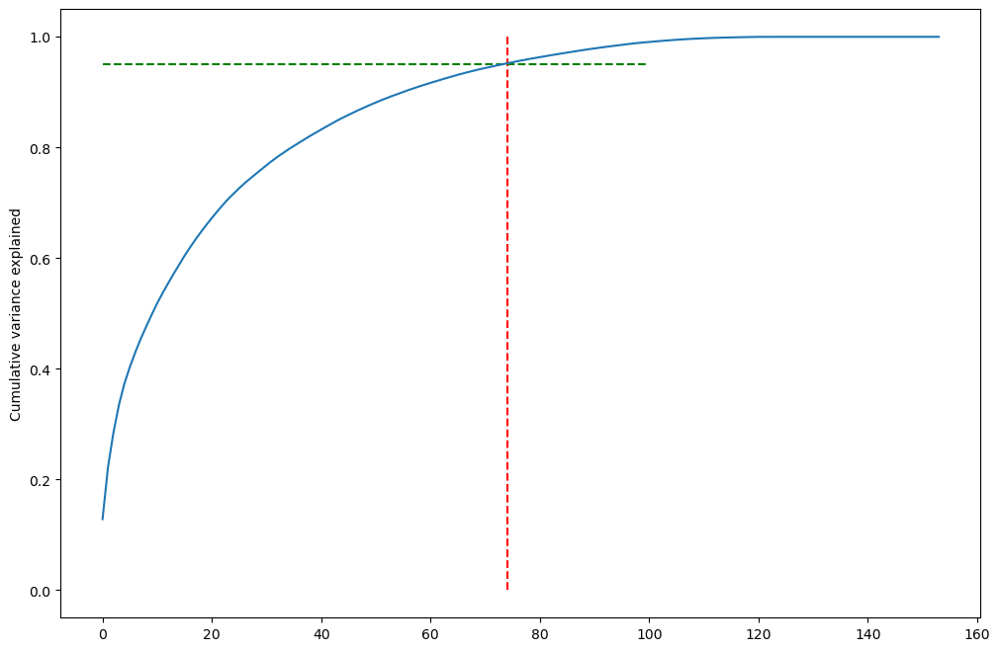

In [58]:
fig = plt.figure(figsize=[12,8])
plt.vlines(x=74, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.95, xmax=100, xmin=0, colors="g", linestyles="--")
plt.plot(var_ratio)
plt.ylabel("Cumulative variance explained")
plt.show()

#### Performing PCA with 74 components

In [59]:
from sklearn.decomposition import IncrementalPCA

In [60]:
pca_final = IncrementalPCA(n_components=74)

In [61]:
df_train_pca = pca_final.fit_transform(X_train)

In [62]:
df_train_pca.shape

(48999, 74)

In [63]:
corrmat = np.corrcoef(df_train_pca.transpose())

In [64]:
corrmat.shape

(74, 74)

<AxesSubplot:>

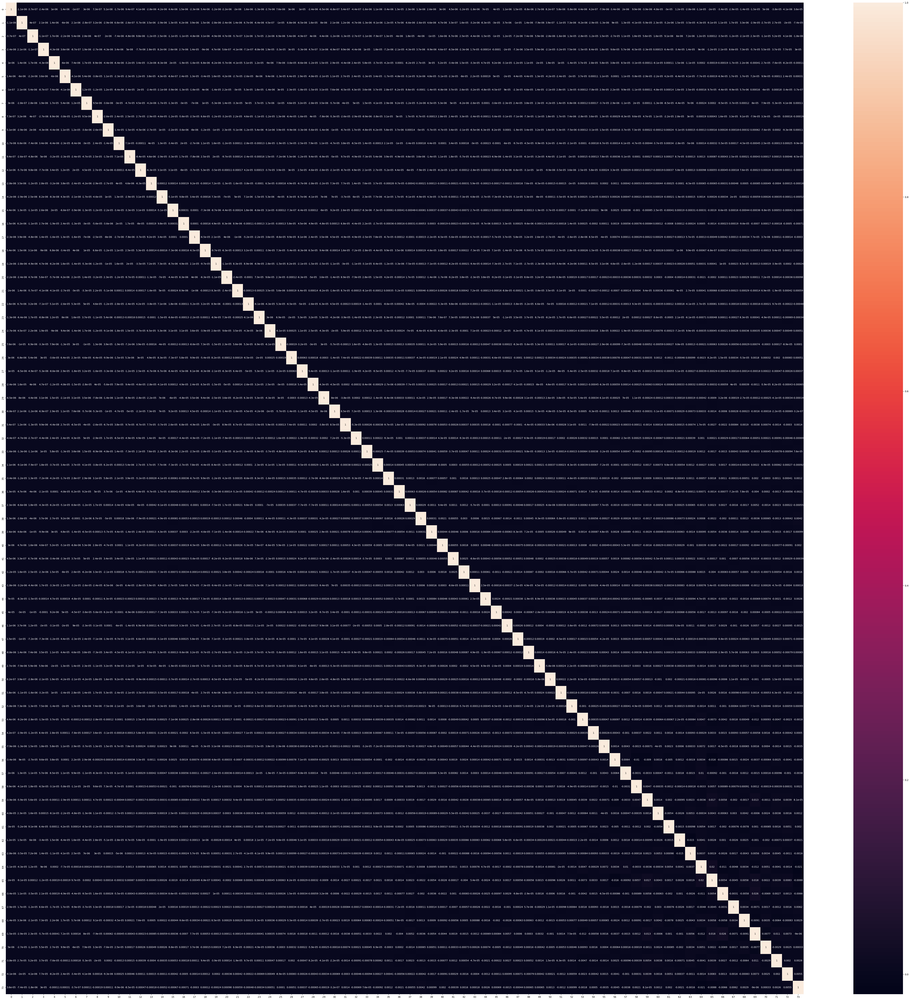

In [65]:
plt.figure(figsize=[75,75])
sns.heatmap(corrmat, annot=True)

#### Applying the transformation on the test set

In [66]:
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(21000, 74)

### Lets build a model now. Considering Decision trees first. 

In [67]:
dt = DecisionTreeClassifier(random_state=42)

In [68]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [2, 3, 5, 10, 20, 40, 80, 100, 150, 200],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}

In [69]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=5, n_jobs=-1, verbose=1, scoring = "accuracy")

In [70]:
%%time
grid_search.fit(df_train_pca, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
CPU times: user 4.82 s, sys: 1.49 s, total: 6.31 s
Wall time: 6min 40s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20, 40, 80, 100, 150, 200],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='accuracy', verbose=1)

In [71]:
score_df = pd.DataFrame(grid_search.cv_results_)
score_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,1.487120,0.024914,0.064644,0.020985,gini,2,5,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.902755,0.898163,0.898061,0.898061,0.898153,0.899039,0.001859,67
1,1.498275,0.037674,0.090857,0.046889,gini,2,10,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.902755,0.898163,0.898061,0.898061,0.898153,0.899039,0.001859,67
2,1.451397,0.040280,0.136117,0.018210,gini,2,20,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.902755,0.898163,0.898061,0.898061,0.898153,0.899039,0.001859,67
3,1.430081,0.035613,0.016050,0.010208,gini,2,50,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.902755,0.898163,0.898061,0.898061,0.898153,0.899039,0.001859,67
4,1.338673,0.076963,0.009365,0.003930,gini,2,100,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.902755,0.898163,0.898061,0.898061,0.898153,0.899039,0.001859,67


In [72]:
grid_search.best_estimator_

DecisionTreeClassifier(max_depth=10, min_samples_leaf=100, random_state=42)

In [73]:
dt_best = grid_search.best_estimator_

In [77]:
def evaluate_model(dt_classifier):
    print("Train Accuracy :", accuracy_score(y_train, dt_classifier.predict(df_train_pca)))
    print("Train Recall :", recall_score(y_train,dt_classifier.predict(df_train_pca),average='weighted'))
    print("Train Precision :", precision_score(y_train,dt_classifier.predict(df_train_pca),average='weighted'))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, dt_classifier.predict(df_train_pca)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, dt_classifier.predict(df_test_pca)))
    print("Test Recall :", recall_score(y_test,dt_classifier.predict(df_test_pca),average='weighted'))
    print("Test Precision :", precision_score(y_test,dt_classifier.predict(df_test_pca),average='weighted'))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, dt_classifier.predict(df_test_pca)))

In [78]:
evaluate_model(dt_best)

Train Accuracy : 0.9211412477805669
Train Recall : 0.9211412477805669
Train Precision : 0.9117259149946387
Train Confusion Matrix:
[[42944  1063]
 [ 2801  2191]]
--------------------------------------------------
Test Accuracy : 0.9107142857142857
Test Recall : 0.9107142857142857
Test Precision : 0.8977003735928936
Test Confusion Matrix:
[[18336   524]
 [ 1351   789]]


In [79]:
print(classification_report(y_train, dt_best.predict(df_train_pca)))

              precision    recall  f1-score   support

           0       0.94      0.98      0.96     44007
           1       0.67      0.44      0.53      4992

    accuracy                           0.92     48999
   macro avg       0.81      0.71      0.74     48999
weighted avg       0.91      0.92      0.91     48999



In [81]:
print(classification_report(y_test, dt_best.predict(df_test_pca)))

              precision    recall  f1-score   support

           0       0.93      0.97      0.95     18860
           1       0.60      0.37      0.46      2140

    accuracy                           0.91     21000
   macro avg       0.77      0.67      0.70     21000
weighted avg       0.90      0.91      0.90     21000



### Lets try Random forest now and see whether it beats scores of DT

In [82]:
classifier_rf = RandomForestClassifier(random_state=42, n_jobs=-1)

In [83]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [1, 2, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'max_features': [2,3,4,5],
    'n_estimators': [10, 30, 50]
}

In [84]:
# Instantiate the grid search model
rfgrid_search = GridSearchCV(estimator=classifier_rf, param_grid=params, 
                          cv=5, n_jobs=-1, verbose=1, scoring = "accuracy")

In [85]:
%%time
rfgrid_search.fit(df_train_pca, y_train)

Fitting 5 folds for each of 300 candidates, totalling 1500 fits
CPU times: user 24.2 s, sys: 3.05 s, total: 27.3 s
Wall time: 10min 38s


GridSearchCV(cv=5, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [1, 2, 5, 10, 20],
                         'max_features': [2, 3, 4, 5],
                         'min_samples_leaf': [5, 10, 20, 50, 100],
                         'n_estimators': [10, 30, 50]},
             scoring='accuracy', verbose=1)

In [86]:
rf_best = rfgrid_search.best_estimator_

In [87]:
evaluate_model(rf_best)

Train Accuracy : 0.9558358333843547
Train Recall : 0.9558358333843547
Train Precision : 0.9572601336278237
Train Confusion Matrix:
[[43970    37]
 [ 2127  2865]]
--------------------------------------------------
Test Accuracy : 0.9115238095238095
Test Recall : 0.9115238095238095
Test Precision : 0.8991213896765728
Test Confusion Matrix:
[[18720   140]
 [ 1718   422]]


In [88]:
print(classification_report(y_train, rf_best.predict(df_train_pca)))

              precision    recall  f1-score   support

           0       0.95      1.00      0.98     44007
           1       0.99      0.57      0.73      4992

    accuracy                           0.96     48999
   macro avg       0.97      0.79      0.85     48999
weighted avg       0.96      0.96      0.95     48999



In [89]:
print(classification_report(y_test, rf_best.predict(df_test_pca)))

              precision    recall  f1-score   support

           0       0.92      0.99      0.95     18860
           1       0.75      0.20      0.31      2140

    accuracy                           0.91     21000
   macro avg       0.83      0.59      0.63     21000
weighted avg       0.90      0.91      0.89     21000



### Random forest has procured better scores compared to DT. 
### Lets try XGBoost and see if it does any better

In [90]:
xgb_train = xgb.XGBClassifier(n_jobs = -1,objective = 'binary:logistic')

In [103]:
params = {
        'n_estimators' : [100, 200], # no of trees 
        'learning_rate' : [0.02, 0.05, 0.1],  # eta
        'min_child_weight': [1, 5, 7, 10],
        'gamma': [0.1, 0.5, 1, 1.5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [15, 20, 25, 30]
        }


param_comb = 10

random_search = RandomizedSearchCV(xgb_train, param_distributions=params, n_iter=param_comb, scoring='accuracy', n_jobs=-1, cv=5, verbose=3, random_state=42)



In [ ]:
%%time
random_search.fit(df_train_pca, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


In [93]:
print('\n Best estimator:')
print(random_search.best_estimator_)
print('\n Best accuracy for %d-fold search with %d parameter combinations:' % (5, param_comb))
print(random_search.best_score_ )
print('\n Best hyperparameters:')
print(random_search.best_params_)


 Best estimator:


AttributeError: 'RandomizedSearchCV' object has no attribute 'best_estimator_'

In [ ]:
xgb_predictions = random_search.predict(df_test_pca)
accuracy_score(y_test, xgb_predictions)

In [ ]:
evaluate_model(random_search)

In [ ]:
print(classification_report(y_train, random_search.predict(df_train_pca)))

In [ ]:
print(classification_report(y_test, random_search.predict(df_test_pca)))

In [ ]:
def final_scores(dt_classifier):
    df = pd.DataFrame({'Model', 'Train_accuracy', 'Test_accuracy', 'Train_recall', 'Test_recall'})
    for classifier in dt_classifier:
        df.loc[len(df.index)] = [classifier, accuracy_score(y_train, classifier.predict(df_train_pca)),
                                 accuracy_score(y_test, classifier.predict(df_test_pca)),
                                 recall_score(y_train,dt_classifier.predict(df_train_pca),average='weighted'),
                                 recall_score(y_test,dt_classifier.predict(df_test_pca),average='weighted')
                                ] 
    return df

In [ ]:
final = final_scores([dt_best, rf_best, random_search])
final

## Making predictions on the given test data in test.csv

In [165]:
test_backup = test
# Scaling the features
cols = test_backup.columns
test_backup = pd.DataFrame(scale(test_backup))
test_backup.columns = cols
test_backup.columns

Index(['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7',
       'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8',
       'roam_ic_mou_6',
       ...
       'fb_user_6', 'fb_user_7', 'fb_user_8', 'aon', 'aug_vbc_3g',
       'jul_vbc_3g', 'jun_vbc_3g', 'day_of_last_rech_6', 'day_of_last_rech_7',
       'day_of_last_rech_8'],
      dtype='object', length=130)

In [ ]:
df_sample_pca = pca_final.transform(test_backup)

df_sample_pca.shape

In [ ]:
y_pred_final = rf_best.predict(df_sample_pca)
y_pred_final[:10]

In [ ]:
# Converting y_pred_final to a dataframe which is an array
y_pred_final = pd.DataFrame(y_pred_final)

In [ ]:
y_pred_final.head()

In [ ]:
y_pred_final = y_pred_final.rename(columns={ 0 : 'Churn_Prob'})

In [ ]:
y_pred_final.head()

In [ ]:
summary['churn_probability'] = y_pred_final
summary.to_csv('submission.csv', index=False)